## Sim Demo

### Imports

In [17]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [18]:
from env.imports import *

In [19]:
import importlib
import data

import models
import sim.sim
import sim.sim_utils
from sim.sim_utils import bytes2human, print_system_usage
from sim.sim import Simulation
from sim.sim_run import single_sim_run

importlib.reload(sim.sim)
importlib.reload(sim.sim_run) 

absolute_root_path /scratch/asr655/neuroinformatics/GeneEx2Conn


<module 'sim.sim_run' from '/scratch/asr655/neuroinformatics/GeneEx2Conn/sim/sim_run.py'>

#### Check job specs

In [20]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 0.1%
RAM Usage: 3.0%
Available RAM: 977.1G
Total RAM: 1007.0G
52.4G


In [21]:
print(os.environ.get("CUDA_VISIBLE_DEVICES"))

# Check available GPUs
print(f"Available GPUs: {torch.cuda.device_count()}")

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)} - Memory Allocated: {torch.cuda.memory_allocated(i)/1024**3:.2f} GB")


None
Available GPUs: 0


In [22]:
torch.cuda.is_available()

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

#### Simulation tests <a id="sims"></a>

In [23]:
from data.data_load import load_connectome, load_transcriptome, load_coords, load_network_labels

In [24]:
X = load_transcriptome(parcellation='S400', gene_list='0.2', dataset='AHBA', run_PCA=False, omit_subcortical=False, hemisphere='both', impute_strategy='mirror_interpolate', sort_genes='refgenome', return_valid_genes=False, null_model='none', random_seed=42)


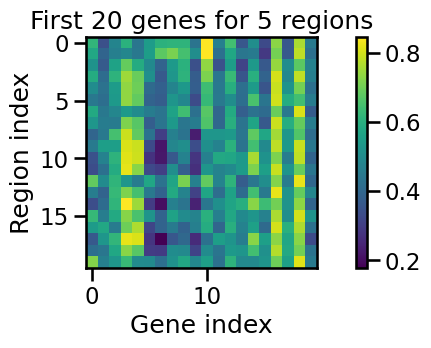

In [27]:
plt.figure(figsize=(10,3))
plt.imshow(X[:20, 40:60], aspect='equal', cmap='viridis')
plt.colorbar()
plt.title('First 20 genes for 5 regions')
plt.xlabel('Gene index')
plt.ylabel('Region index') 
plt.show()


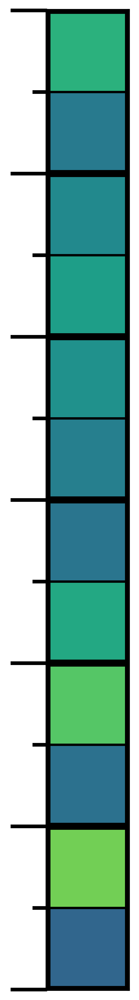

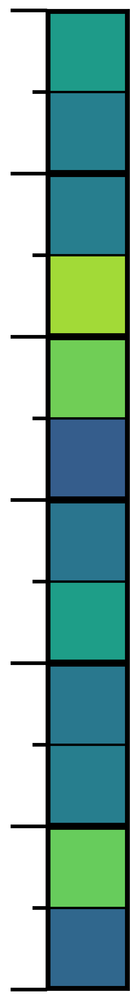

In [28]:
region6 = X[6, 40:52].reshape(-1,1)  
region11 = X[7, 40:52].reshape(-1,1)

plt.figure(figsize=(1,15), dpi=600)  # Increased DPI for higher resolution
ax1 = plt.gca()
ax1.set_facecolor('none')  # Transparent background
plt.gcf().set_facecolor('none')  # Transparent figure background
im1 = ax1.imshow(region6, aspect='equal', cmap='viridis', vmin=0.2, vmax=0.8, interpolation='nearest')

# Remove default grid
ax1.grid(False)
# Add grid lines exactly at pixel boundaries
for i in range(13):
    ax1.axhline(y=i-0.5, color='black', linewidth=1.6)
for i in range(2):
    ax1.axvline(x=i-0.5, color='black', linewidth=1.6)
# Add thicker lines every 2 squares
for i in range(0,13,2):
    ax1.axhline(y=i-0.5, color='black', linewidth=4.8)
ax1.axvline(x=-0.5, color='black', linewidth=4.8)
ax1.axvline(x=0.5, color='black', linewidth=4.8)
ax1.set_xticks([])
# Add ticks for each square and every 2nd square
ax1.set_yticks(np.arange(-0.5, 11.5, 1), minor=True)  # Individual squares
ax1.set_yticks([-0.5, 1.5, 3.5, 5.5, 7.5, 9.5, 11.5], minor=False)  # Block boundaries
ax1.set_yticklabels([])
ax1.tick_params(axis='y', which='minor', length=10, width=2.5)
ax1.tick_params(axis='y', which='major', length=25, width=2.5)
plt.savefig('region6.png', dpi=600, bbox_inches='tight', transparent=True)
plt.show()

plt.figure(figsize=(1,15), dpi=600)  # Increased DPI for higher resolution
ax2 = plt.gca()
ax2.set_facecolor('none')  # Transparent background
plt.gcf().set_facecolor('none')  # Transparent figure background
im2 = ax2.imshow(region11, aspect='equal', cmap='viridis', vmin=0.2, vmax=0.8, interpolation='nearest')
# Remove default grid
ax2.grid(False)
# Add grid lines exactly at pixel boundaries
for i in range(13):
    ax2.axhline(y=i-0.5, color='black', linewidth=1.6)
for i in range(2):
    ax2.axvline(x=i-0.5, color='black', linewidth=1.6)
# Add thicker lines every 2 squares
for i in range(0,13,2):
    ax2.axhline(y=i-0.5, color='black', linewidth=4.8)
ax2.axvline(x=-0.5, color='black', linewidth=4.8)
ax2.axvline(x=0.5, color='black', linewidth=4.8)
ax2.set_xticks([])
# Add ticks for each square and every 2nd square
ax2.set_yticks(np.arange(-0.5, 11.5, 1), minor=True)  # Individual squares
ax2.set_yticks([-0.5, 1.5, 3.5, 5.5, 7.5, 9.5, 11.5], minor=False)  # Block boundaries
ax2.set_yticklabels([])
ax2.tick_params(axis='y', which='minor', length=10, width=2.5)
ax2.tick_params(axis='y', which='major', length=25, width=2.5)
plt.savefig('region11.png', dpi=600, bbox_inches='tight', transparent=True)
plt.show()


In [9]:
load_transcriptome(parcellation='iPA_729', gene_list='0.2', dataset='AHBA', run_PCA=False, omit_subcortical=False, hemisphere='both', impute_strategy='mirror_interpolate', sort_genes='refgenome', return_valid_genes=False, null_model='none', random_seed=42)


array([[0.73207032, 0.31509492, 0.55882771, ..., 0.61566745, 0.61872769,
        0.1927428 ],
       [0.40372878, 0.58118856, 0.361784  , ..., 0.62023836, 0.50592621,
        0.38853847],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [0.14459789, 0.30214342, 0.64788584, ..., 0.10616451, 0.55174263,
        0.78644128],
       [0.40885357, 0.09715725, 0.85434756, ..., 0.20760721, 0.63817478,
        0.61732512],
       [0.26637466, 0.28825971, 0.64770826, ..., 0.19774444, 0.69248973,
        0.71285282]])

In [12]:
absolute_data_path = '/scratch/asr655/neuroinformatics/GeneEx2Conn_data'
BHA2_path = absolute_data_path + '/BHA2/iPA_729'
BHA2_fc_path = BHA2_path + '/fc'

In [14]:
# # Get list of all CSV files in directory
# csv_files = [f for f in os.listdir(BHA2_fc_path) if f.endswith('.csv')]

# # Initialize list to store arrays
# arrays = []

# # Load all CSV files
# for csv_file in csv_files:
#     # Read with space separator since files are space-delimited
#     df = pd.read_csv(os.path.join(BHA2_fc_path, csv_file), sep=' ', header=None)
#     # Convert any string representations to numeric values
#     df = df.apply(pd.to_numeric, errors='coerce')
#     # Convert dataframe to numpy array and append
#     arrays.append(df.to_numpy())
    
# # Calculate mean connectivity matrix
# mean_connectivity = np.mean(arrays, axis=0)

# # Save mean connectivity matrix to csv
# mean_df = pd.DataFrame(mean_connectivity)
# mean_df.to_csv(os.path.join(BHA2_fc_path, 'fc_mean.csv'), index=False, header=False)

# # Create figure to visualize mean connectivity
# plt.figure(figsize=(10,8))
# plt.imshow(mean_connectivity, cmap='RdBu_r', vmin=-1, vmax=1)
# plt.colorbar()
# plt.title('Mean Connectivity Matrix')
# plt.show()

# # Display mean connectivity matrix
# print("Mean connectivity:")
# display(pd.DataFrame(mean_connectivity))

In [15]:
X = load_transcriptome(parcellation='iPA_183', gene_list='0.2', dataset='AHBA', run_PCA=False, omit_subcortical=False, hemisphere='both', impute_strategy='mirror_interpolate', sort_genes='refgenome', return_valid_genes=False, null_model='none', random_seed=42)


In [16]:
Y = load_connectome(parcellation='iPA_183')
print(Y)
print(Y.shape)

[[0.         0.17561702 0.28216942 ... 0.29594169 0.2457213  0.27097152]
 [0.17561702 0.         0.21294289 ... 0.37171529 0.47270243 0.39883024]
 [0.28216942 0.21294289 0.         ... 0.15405294 0.13554151 0.15667567]
 ...
 [0.29594169 0.37171529 0.15405294 ... 0.         0.69735088 0.69576054]
 [0.2457213  0.47270243 0.13554151 ... 0.69735088 0.         0.85380691]
 [0.27097152 0.39883024 0.15667567 ... 0.69576054 0.85380691 0.        ]]
(183, 183)


In [17]:
coordinates = load_coords(parcellation='iPA_729')
print(coordinates)
print(coordinates.shape)

[[-35.214   51.864   18.146 ]
 [-38.673   30.701   34.598 ]
 [  6.6719   8.5     55.266 ]
 ...
 [ 18.792   -5.9703 -17.663 ]
 [-16.456  -17.067    4.2778]
 [  8.8929 -15.268   12.107 ]]
(729, 3)


In [18]:
labels, network_labels = load_network_labels(parcellation='iPA_729')
print(labels)


[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 22

In [ ]:
single_sim_run(
              feature_type=[{'transcriptome': None}],
              use_shared_regions=False,
              test_shared_regions=False,
              omit_subcortical=False,
              parcellation='iPA_391',
              hemisphere='both',
              connectome_target='FC',
              binarize=False,
              impute_strategy='mirror_interpolate',
              sort_genes='refgenome',
              gene_list='0.2',
              cv_type='random',
              random_seed=2,
              search_method=('wandb', 'mse', 5),
              track_wandb=False,
              skip_cv=True,
              model_type='dynamic_mlp',
              use_gpu=True, 
              null_model='none'
              )

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()
# Clear CPU memory
gc.collect()

Number of components for 95% variance PCA: 105
X shape: (345, 7380)
X_pca shape: (345, 105)
Y_sc shape: (345, 345)
Y_sc_spectralL shape: (345, 391)
Y_sc_spectralA shape: (345, 391)
Y_fc shape: (345, 345)
Coordinates shape: (345, 3)
Y shape (345, 345)
feature_name:  transcriptome
processing_type:  None
features ['transcriptome']
X generated... expanding to pairwise dataset


  return LooseVersion(v) >= LooseVersion(check)

ERROR: Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: asratzan (alexander-ratzan-new-york-university). Use `wandb login --relogin` to force relogin
wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: m8xbr1ei
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/m8xbr1ei
Initialized sweep with ID: m8xbr1ei
2
3
4
BEST CONFIG {'input_dim': 14760, 'binarize': False, 'hidden_dims': [256, 128], 'learning_rate': 9e-05, 'batch_size': 512, 'dropout_rate': 0.2, 'weight_decay': 0.0001, 'epochs': 100}


  warnings.warn(



Number of learnable parameters in MLP: 3812609
Using device: cuda
GPU 0: NVIDIA A100-SXM4-80GB - Memory Allocated: 0.01 GB
Best val loss so far at epoch 1: 0.0494
Best val loss so far at epoch 3: 0.0293
Best val loss so far at epoch 4: 0.0266


Number of components for 95% variance PCA: 27
Number of 1s: 36662, Number of 0s: 171274, Class balance (1s): 0.176
Number of 1s: 17738, Number of 0s: 190198, Class balance (1s): 0.085
X shape: (455, 7380)
X_pca shape: (455, 27)
Y_sc shape: (455, 455)
Y_sc_spectralL shape: (455, 455)
Y_sc_spectralA shape: (455, 456)
Y_fc shape: (455, 455)
Coordinates shape: (455, 3)
Y shape (455, 455)
feature_name:  transcriptome
processing_type:  None
features ['transcriptome']
X generated... expanding to pairwise dataset


wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: reqk55qc
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/reqk55qc
Initialized sweep with ID: reqk55qc


  warnings.warn(



2
3
4
BEST CONFIG {'input_dim': 14760, 'binarize': False, 'activation': 'none', 'learning_rate': 0.0001, 'batch_size': 256, 'regularization': 'l2', 'lambda_reg': 0.001, 'shared_weights': True, 'reduced_dim': 10, 'epochs': 125}
Number of learnable parameters in bilinear low rank model: 73800
Using device: cuda
GPU 0: NVIDIA A100-SXM4-80GB - Memory Allocated: 0.03 GB
Best val loss so far at epoch 1: 0.0304
Best val loss so far at epoch 2: 0.0280
Best val loss so far at epoch 3: 0.0262
Best val loss so far at epoch 4: 0.0248
Epoch 5/125, Train Loss: 0.0229, Val Loss: 0.0255, Time: 4.14s
Best val loss so far at epoch 6: 0.0232
Best val loss so far at epoch 7: 0.0230
Best val loss so far at epoch 8: 0.0230
Epoch 10/125, Train Loss: 0.0177, Val Loss: 0.0238, Time: 3.77s
Best val loss so far at epoch 11: 0.0219
Best val loss so far at epoch 12: 0.0216
Best val loss so far at epoch 13: 0.0208
Best val loss so far at epoch 14: 0.0208
Epoch 15/125, Train Loss: 0.0141, Val Loss: 0.0209, Time: 3.9

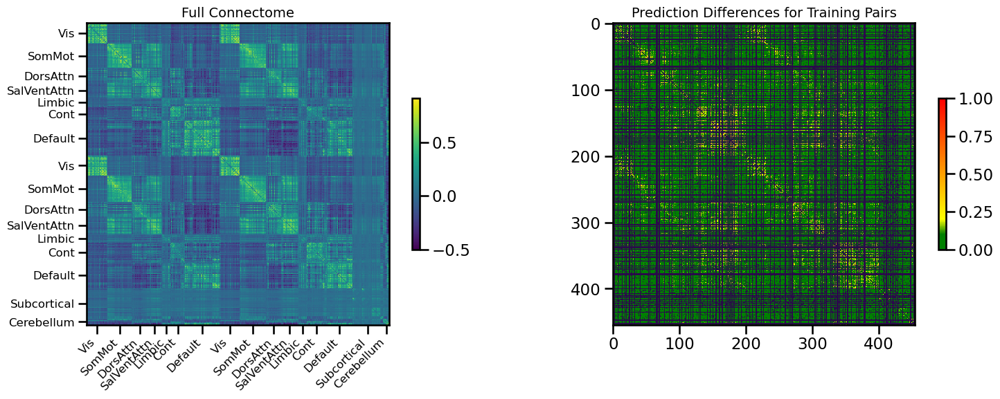

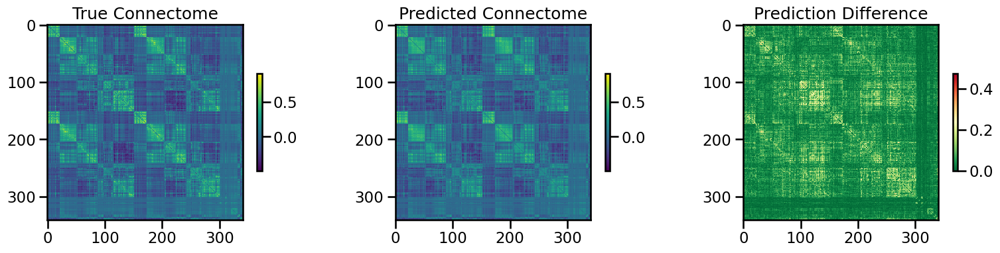

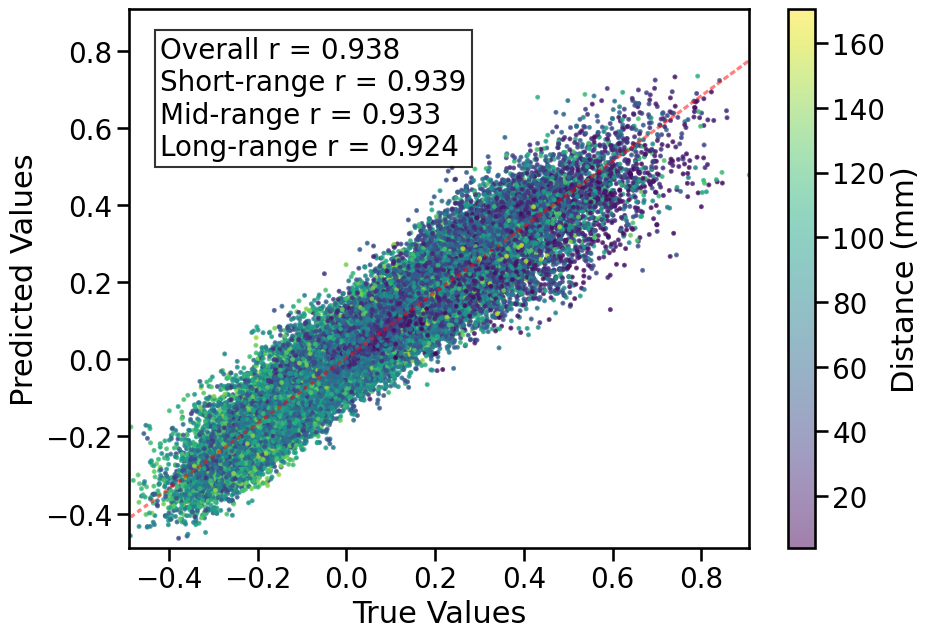

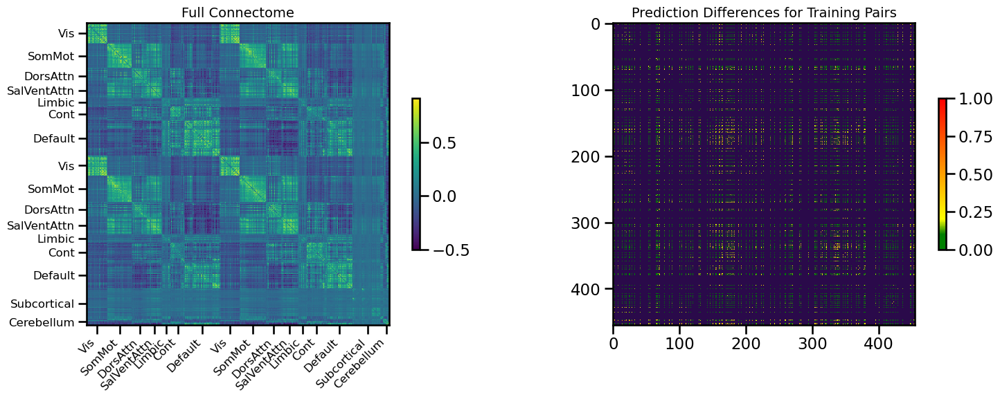

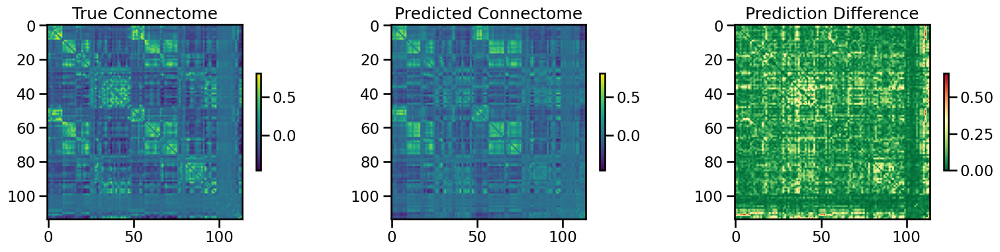

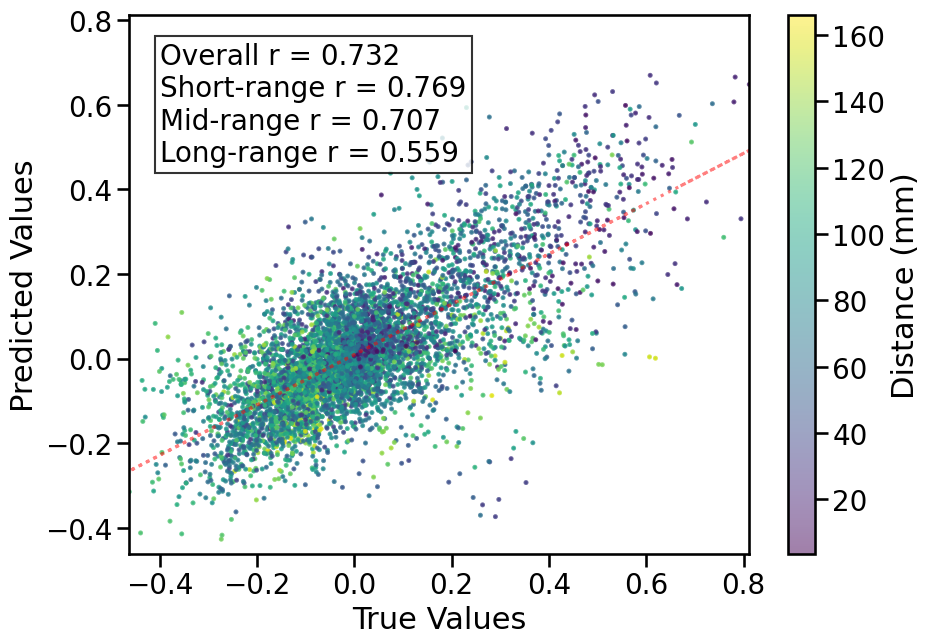


TRAIN METRICS: {'mse': 0.0041469517, 'mae': 0.04537188, 'r2': 0.8784466832027069, 'pearson_r': 0.9378328698464512, 'short_r': 0.9389293273241243, 'mid_r': 0.9331409530967493, 'long_r': 0.9240676967472623, 'geodesic_distance': 15.50520833305544}
TEST METRICS: {'mse': 0.014660512, 'mae': 0.08609255, 'r2': 0.5280182535957447, 'pearson_r': 0.7316531087770076, 'short_r': 0.7689656137196363, 'mid_r': 0.7069333865718217, 'long_r': 0.5592897411789558, 'geodesic_distance': 11.077310007888261}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'activation': Identity(), 'learning_rate': 0.0001, 'epochs': 125, 'batch_size': 256, 'regularization': 'l2', 'lambda_reg': 0.001, 'shared_weights': True}


  warnings.warn(



1
3
4
BEST CONFIG {'input_dim': 14760, 'binarize': False, 'activation': 'none', 'learning_rate': 0.0001, 'batch_size': 256, 'regularization': 'l2', 'lambda_reg': 0.001, 'shared_weights': True, 'reduced_dim': 10, 'epochs': 125}
Number of learnable parameters in bilinear low rank model: 73800
Using device: cuda
GPU 0: NVIDIA A100-SXM4-80GB - Memory Allocated: 0.03 GB
Best val loss so far at epoch 1: 0.0365
Best val loss so far at epoch 2: 0.0327
Best val loss so far at epoch 3: 0.0295
Best val loss so far at epoch 4: 0.0283
Best val loss so far at epoch 5: 0.0281
Epoch 5/125, Train Loss: 0.0230, Val Loss: 0.0281, Time: 3.70s
Best val loss so far at epoch 6: 0.0273
Best val loss so far at epoch 7: 0.0244
Best val loss so far at epoch 9: 0.0233
Epoch 10/125, Train Loss: 0.0183, Val Loss: 0.0243, Time: 4.12s
Best val loss so far at epoch 11: 0.0217
Best val loss so far at epoch 12: 0.0215
Best val loss so far at epoch 13: 0.0208
Best val loss so far at epoch 14: 0.0206
Best val loss so far 

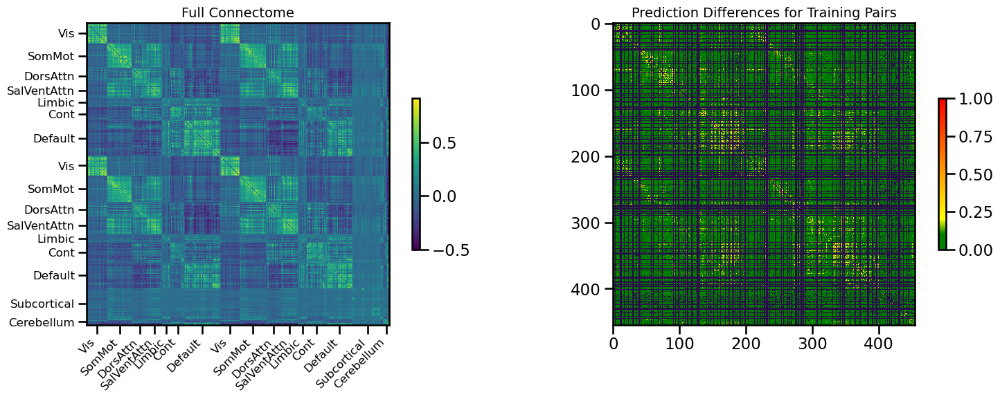

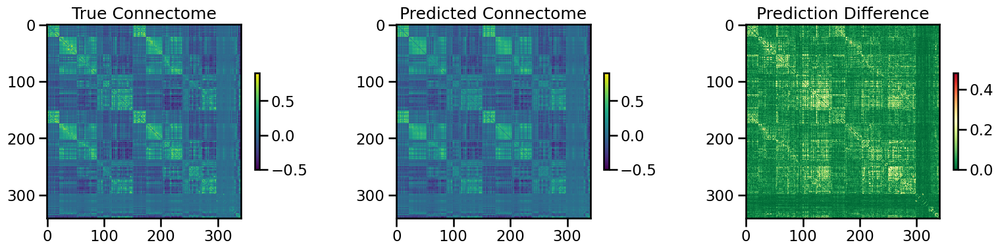

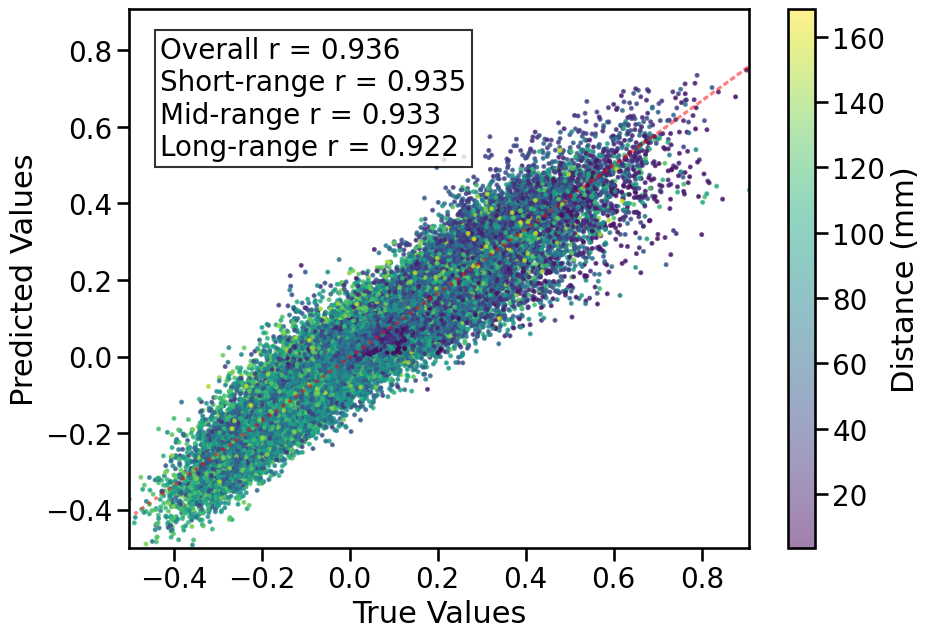

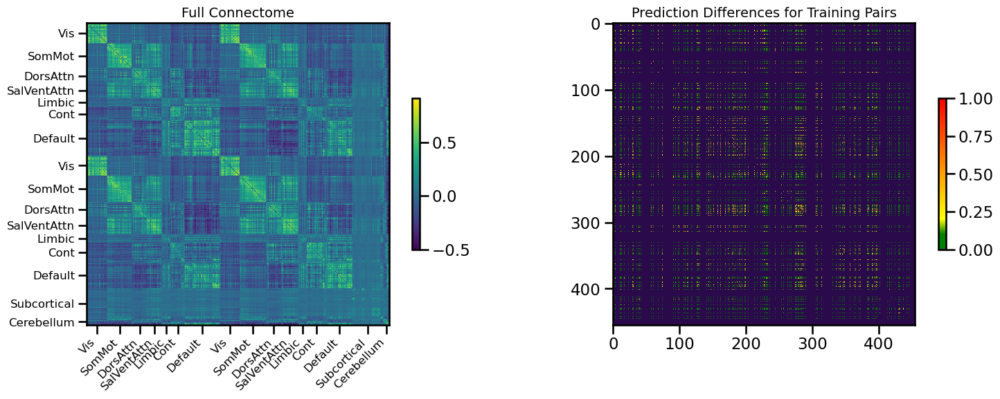

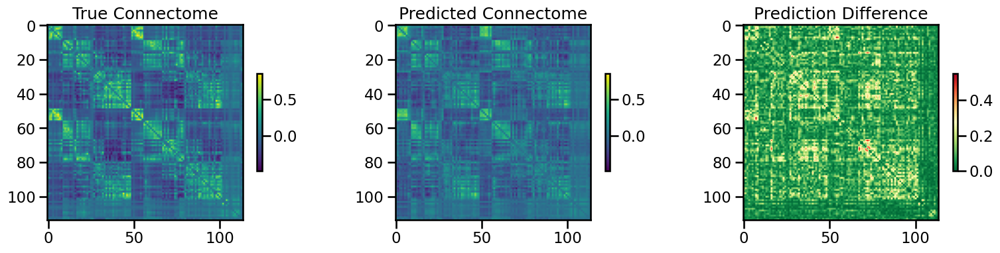

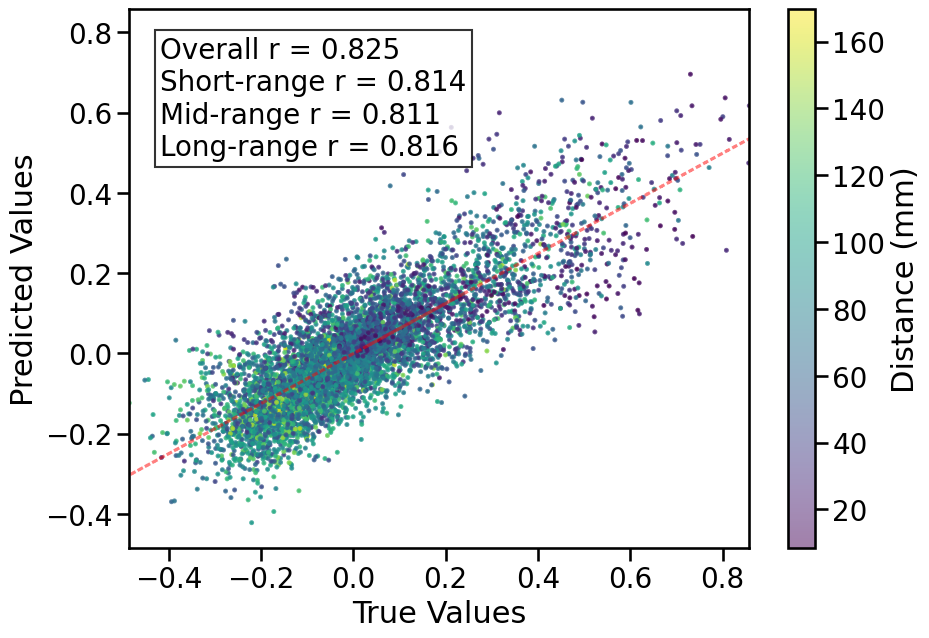


TRAIN METRICS: {'mse': 0.004046477, 'mae': 0.044126477, 'r2': 0.874320330812282, 'pearson_r': 0.9364482597766166, 'short_r': 0.9352417694905851, 'mid_r': 0.9333697615722447, 'long_r': 0.9217571104645262, 'geodesic_distance': 17.16929718869666}
TEST METRICS: {'mse': 0.012089328, 'mae': 0.08123085, 'r2': 0.67546706850603, 'pearson_r': 0.8251249059115395, 'short_r': 0.8136206657301022, 'mid_r': 0.8113290119527987, 'long_r': 0.8162430582563437, 'geodesic_distance': 9.709570541733319}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'activation': Identity(), 'learning_rate': 0.0001, 'epochs': 125, 'batch_size': 256, 'regularization': 'l2', 'lambda_reg': 0.001, 'shared_weights': True}


  warnings.warn(



1
2
4
BEST CONFIG {'input_dim': 14760, 'binarize': False, 'activation': 'none', 'learning_rate': 0.0001, 'batch_size': 256, 'regularization': 'l2', 'lambda_reg': 0.001, 'shared_weights': True, 'reduced_dim': 8, 'epochs': 125}
Number of learnable parameters in bilinear low rank model: 59040
Using device: cuda
GPU 0: NVIDIA A100-SXM4-80GB - Memory Allocated: 0.03 GB
Best val loss so far at epoch 1: 0.0285
Best val loss so far at epoch 2: 0.0266
Best val loss so far at epoch 3: 0.0241
Best val loss so far at epoch 4: 0.0239
Best val loss so far at epoch 5: 0.0216
Epoch 5/125, Train Loss: 0.0242, Val Loss: 0.0216, Time: 3.93s
Best val loss so far at epoch 7: 0.0215
Best val loss so far at epoch 8: 0.0203
Best val loss so far at epoch 9: 0.0200
Epoch 10/125, Train Loss: 0.0192, Val Loss: 0.0201, Time: 3.87s
Best val loss so far at epoch 11: 0.0198
Best val loss so far at epoch 13: 0.0190
Epoch 15/125, Train Loss: 0.0153, Val Loss: 0.0195, Time: 4.02s
Best val loss so far at epoch 16: 0.0187

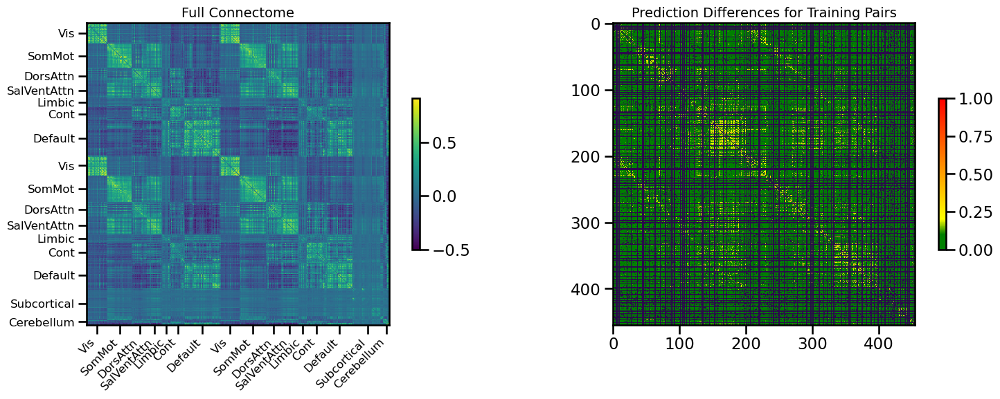

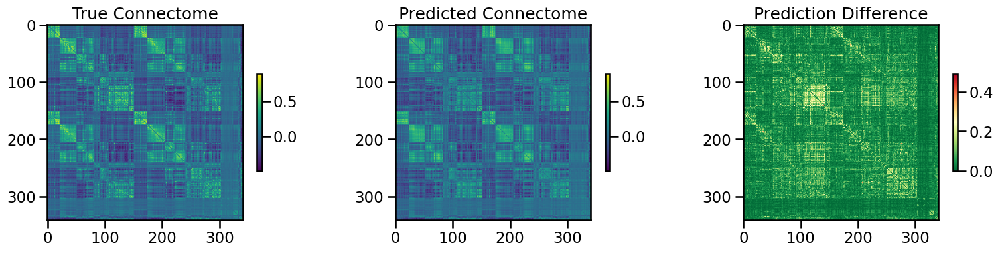

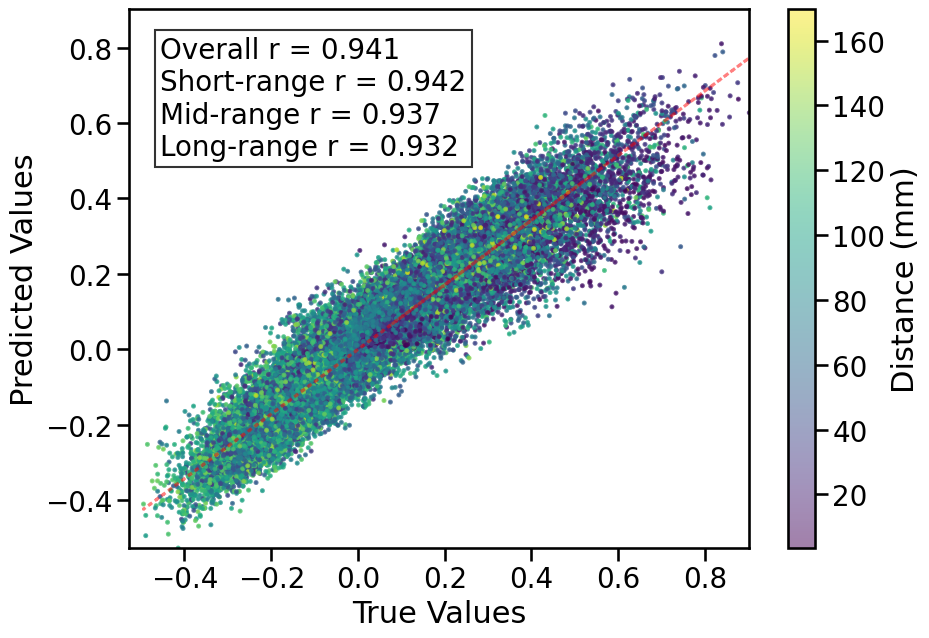

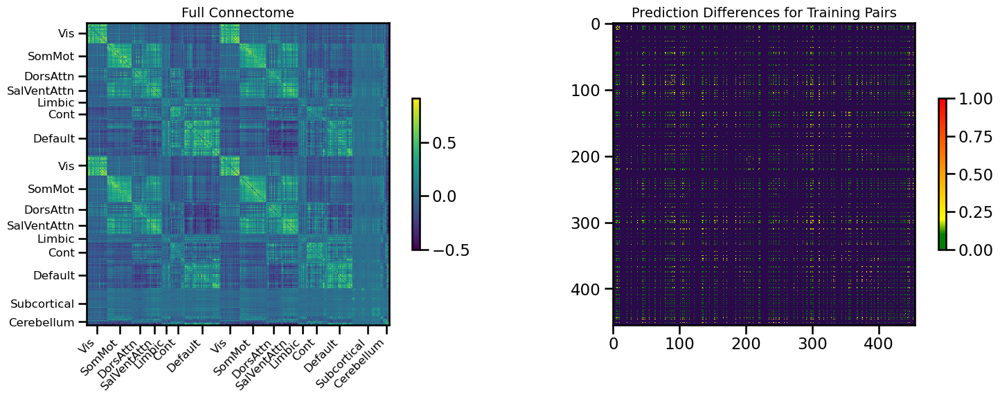

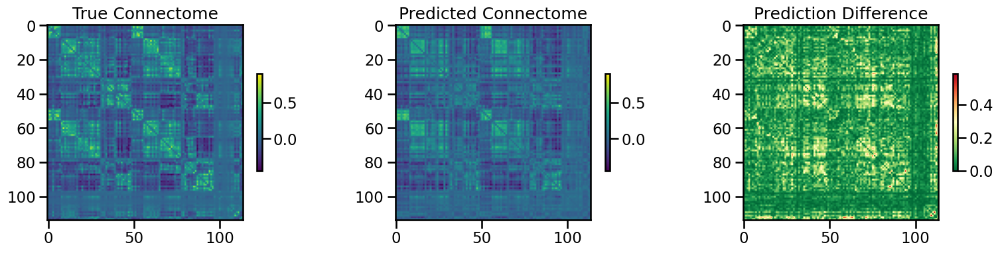

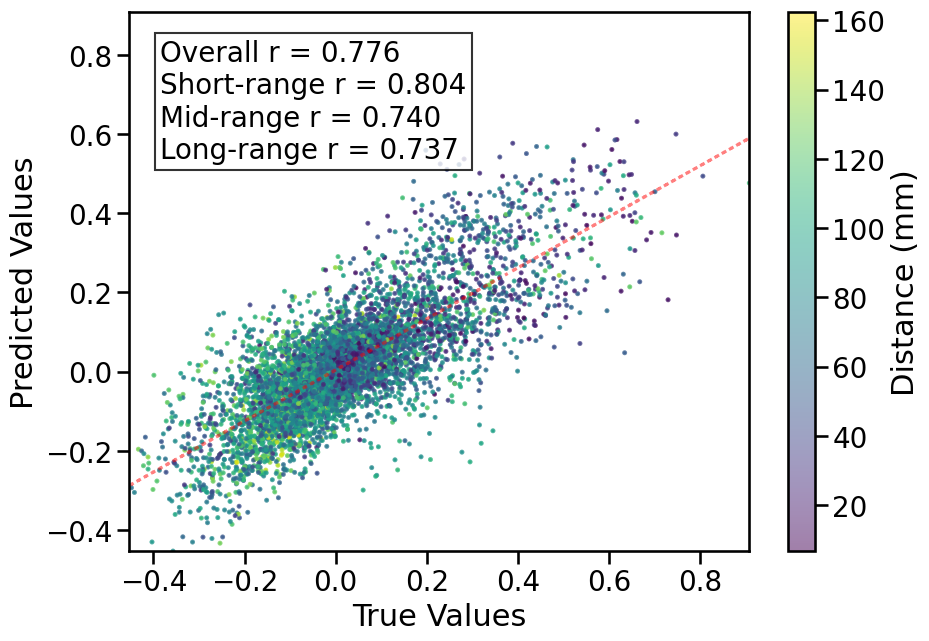


TRAIN METRICS: {'mse': 0.00405727, 'mae': 0.044971026, 'r2': 0.8843053948151622, 'pearson_r': 0.9409505285270943, 'short_r': 0.9415112116796613, 'mid_r': 0.9372416049830115, 'long_r': 0.9316847234289201, 'geodesic_distance': 16.96758298174785}
TEST METRICS: {'mse': 0.011473821, 'mae': 0.07800795, 'r2': 0.5985054579040427, 'pearson_r': 0.7758406308083202, 'short_r': 0.8042032156925083, 'mid_r': 0.7396804522462065, 'long_r': 0.7365679019755185, 'geodesic_distance': 11.800809620477528}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'activation': Identity(), 'learning_rate': 0.0001, 'epochs': 125, 'batch_size': 256, 'regularization': 'l2', 'lambda_reg': 0.001, 'shared_weights': True}


  warnings.warn(



1
2
3
BEST CONFIG {'input_dim': 14760, 'binarize': False, 'activation': 'none', 'learning_rate': 0.0001, 'batch_size': 256, 'regularization': 'l2', 'lambda_reg': 0.001, 'shared_weights': True, 'reduced_dim': 8, 'epochs': 125}
Number of learnable parameters in bilinear low rank model: 59040
Using device: cuda
GPU 0: NVIDIA A100-SXM4-80GB - Memory Allocated: 0.03 GB
Best val loss so far at epoch 1: 0.0361
Best val loss so far at epoch 2: 0.0335
Best val loss so far at epoch 3: 0.0303
Best val loss so far at epoch 4: 0.0273
Best val loss so far at epoch 5: 0.0261
Epoch 5/125, Train Loss: 0.0251, Val Loss: 0.0261, Time: 3.97s
Best val loss so far at epoch 8: 0.0246
Best val loss so far at epoch 9: 0.0234
Epoch 10/125, Train Loss: 0.0191, Val Loss: 0.0254, Time: 3.88s
Best val loss so far at epoch 11: 0.0227
Best val loss so far at epoch 12: 0.0226
Best val loss so far at epoch 13: 0.0220
Best val loss so far at epoch 14: 0.0218
Epoch 15/125, Train Loss: 0.0153, Val Loss: 0.0233, Time: 3.94

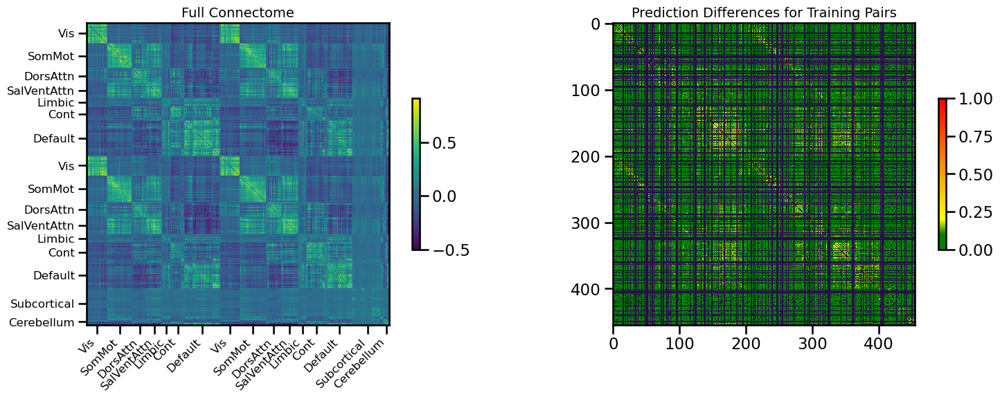

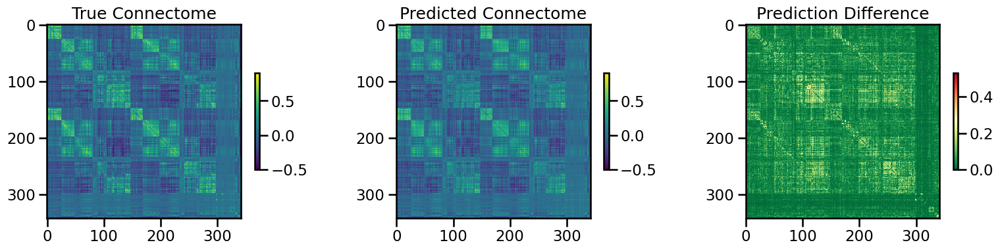

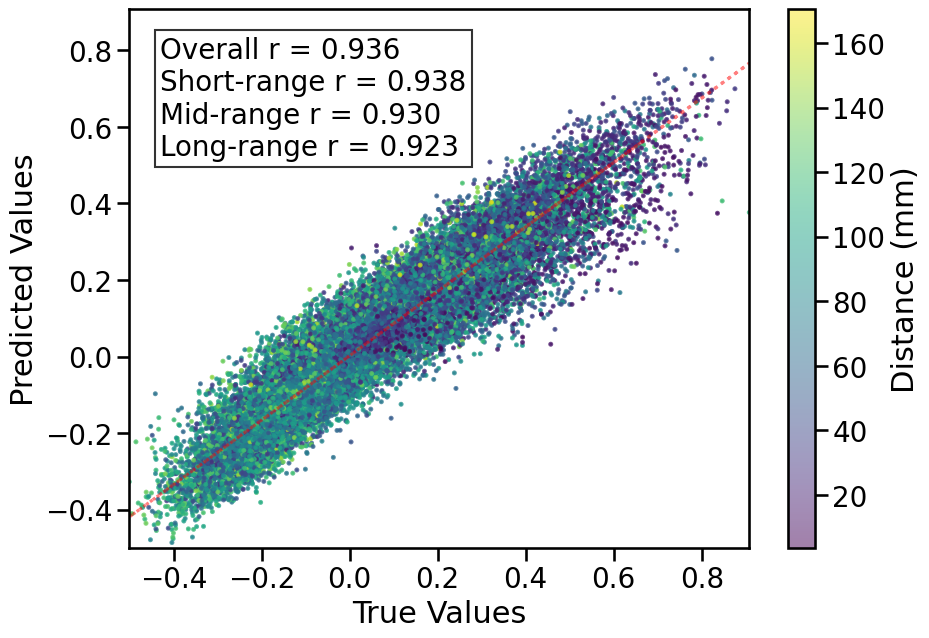

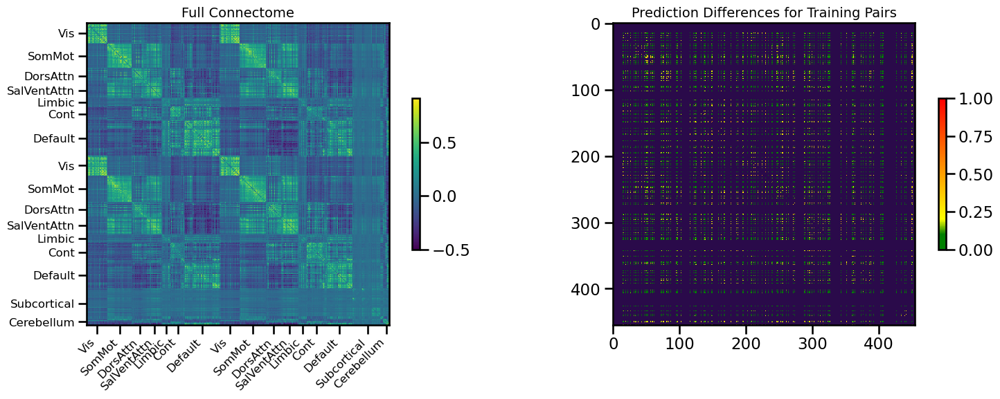

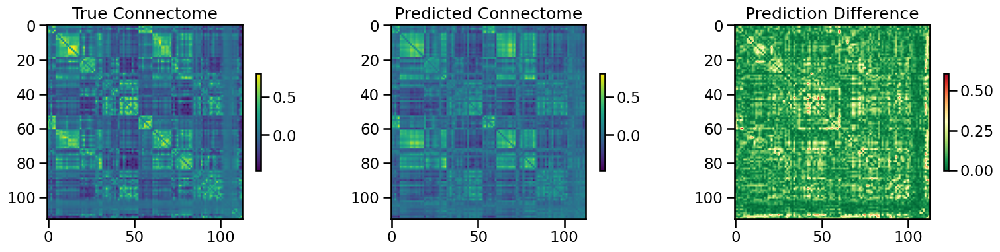

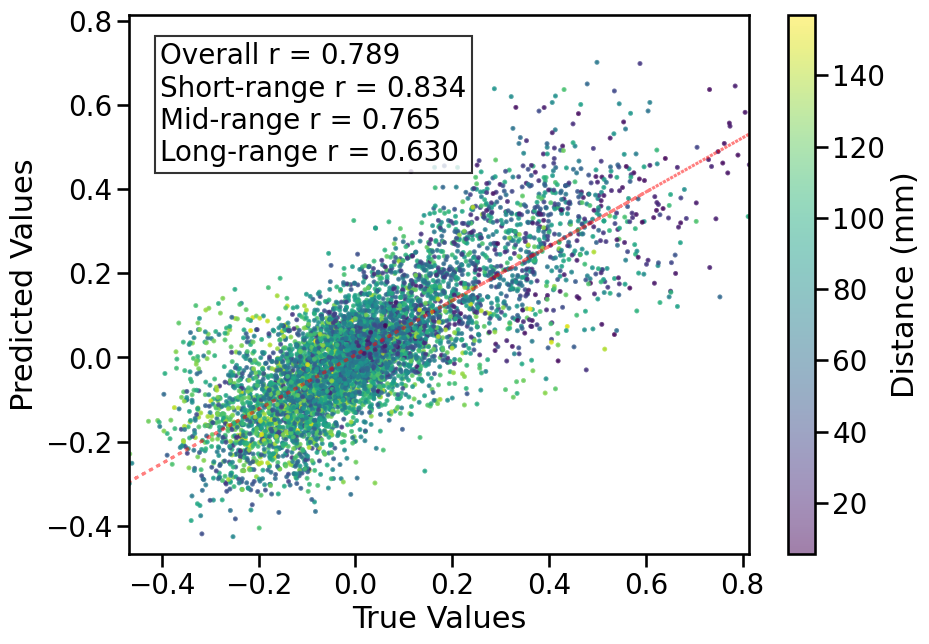


TRAIN METRICS: {'mse': 0.004115823, 'mae': 0.044721667, 'r2': 0.8742282010356025, 'pearson_r': 0.9356982572487043, 'short_r': 0.9375038875851054, 'mid_r': 0.9298446777572603, 'long_r': 0.9229179368642657, 'geodesic_distance': 16.822393859406784}
TEST METRICS: {'mse': 0.013983597, 'mae': 0.087509744, 'r2': 0.6207657862733513, 'pearson_r': 0.7885366184578675, 'short_r': 0.8337424698008694, 'mid_r': 0.7650105321444651, 'long_r': 0.6299515729412939, 'geodesic_distance': 10.873402510134083}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'activation': Identity(), 'learning_rate': 0.0001, 'epochs': 125, 'batch_size': 256, 'regularization': 'l2', 'lambda_reg': 0.001, 'shared_weights': True}
CPU Usage: 3.8%
RAM Usage: 29.4%
Available RAM: 710.8G
Total RAM: 1007.0G
| ID | GPU | MEM |
------------------
|  0 |  0% |  1% |
Sim complete
Simulation completed in 2077.99 seconds (34.63 minutes)


5818

In [9]:
single_sim_run(
              feature_type=[{'transcriptome': None}, {'euclidean': None}],
              use_shared_regions=False,
              test_shared_regions=False,
              omit_subcortical=False,
              parcellation='S400',
              hemisphere='both',
              connectome_target='FC',
              binarize=False,
              impute_strategy='mirror_interpolate',
              sort_genes='refgenome',
              gene_list='0.2',
              cv_type='random',
              random_seed=2,
              search_method=('wandb', 'mse', 5),
              track_wandb=False,
              skip_cv=True,
              model_type='dynamic_mlp',
              use_gpu=True, 
              null_model='none'
              )

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()
# Clear CPU memory
gc.collect()